In [1]:
%%writefile predictor.py

import os, cv2
import joblib
from detectron2.utils.visualizer import Visualizer

import warnings
warnings.filterwarnings("ignore")


class BookSegmentsPredictor(object):

    def __init__(self, model):
        self._model = model
        
    def predict(self, instance, **kwargs):
        if 'photo_as_numpy_array' in instance and instance['photo_as_numpy_array'] is not None:
            im = instance['photo_as_numpy_array']
        elif 'photo_filepath' in instance and instance['photo_filepath'] is not None:
            im = cv2.imread(instance['photo_filepath'])
        else:
            return {'error': 'Invalid input instance format'}
        
        outputs =self._model(im)

        result = {}
        if 'return_masks' in instance and instance['return_masks']:
            result['predicted_masks'] = pred_masks = outputs['instances'].pred_masks.numpy()
        
        if 'return_photo' in instance and instance['return_photo']:
            v = Visualizer(im[:, :, ::-1], scale=1.)
            out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
            result['predicted_photo'] = out.get_image()[:, :, ::-1]
        
        return result
    
    
    @classmethod
    def from_path(cls, model_dir):
        model_path = os.path.join(model_dir, 'model.joblib')
        model = joblib.load(model_path)
        return cls(model)


Overwriting predictor.py


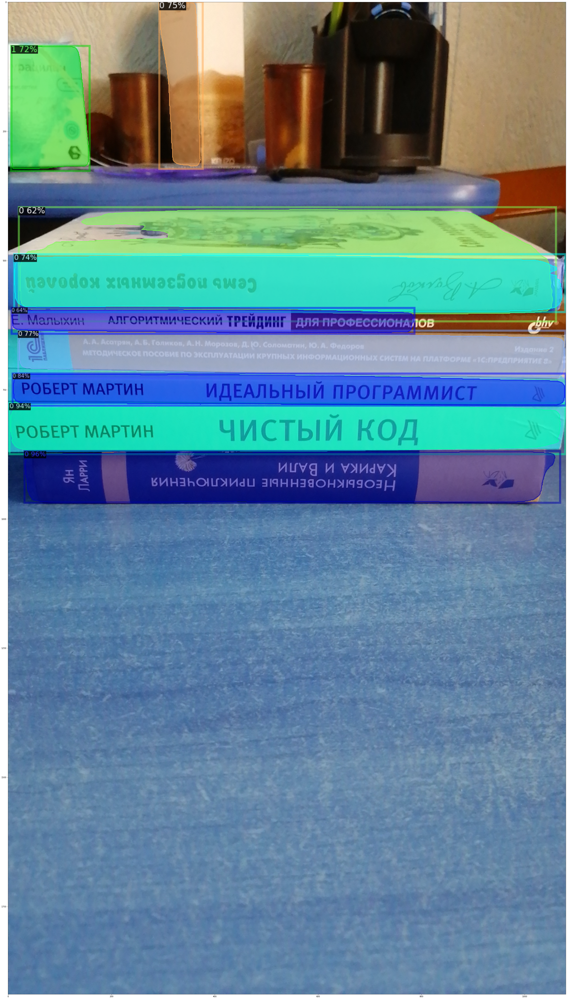

In [2]:
from predictor import BookSegmentsPredictor
import cv2
from detectron2.utils.visualizer import Visualizer

from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (50,100)

model = BookSegmentsPredictor.from_path('.')

#temple
instance = {'photo_as_numpy_array': None, 'photo_filepath': None, 'return_masks': False, 'return_photo': False}

file_name = 'test_photo.jpg'
im = cv2.imread(file_name)

instance = {'photo_as_numpy_array': im, 'photo_filepath': None, 'return_masks': True, 'return_photo': True}
outputs = model.predict(instance)  

#print(outputs)
plt.imshow(outputs['predicted_photo']);


In [28]:
%%writefile setup.py
from setuptools import setup
from setuptools import find_packages

REQUIRED_PACKAGES = ['Pillow', 'torchvision', 'opencv-python']

dependencies = [
    'https://github.com/facebookresearch/detectron2.git',
]

setup(
    name='custom_predict',
    version='0.1',
    install_requires=REQUIRED_PACKAGES,
    packages=find_packages(),
    #package_dir={"": "./detectron2"},
    #package_data={"": ["*.*"]},
    dependency_links=dependencies,
    include_package_data=True,
    scripts=['predictor.py'])




Overwriting setup.py


In [29]:
!python setup.py sdist --formats=gztar

running sdist
running egg_info
writing custom_predict.egg-info/PKG-INFO
writing dependency_links to custom_predict.egg-info/dependency_links.txt
writing requirements to custom_predict.egg-info/requires.txt
writing top-level names to custom_predict.egg-info/top_level.txt
reading manifest file 'custom_predict.egg-info/SOURCES.txt'
writing manifest file 'custom_predict.egg-info/SOURCES.txt'

running check


creating custom_predict-0.1
creating custom_predict-0.1/custom_predict.egg-info
creating custom_predict-0.1/custom_predict.egg-info/.ipynb_checkpoints
copying files to custom_predict-0.1...
copying predictor.py -> custom_predict-0.1
copying setup.py -> custom_predict-0.1
copying ./custom_predict.egg-info/PKG-INFO -> custom_predict-0.1/./custom_predict.egg-info
copying ./custom_predict.egg-info/SOURCES.txt -> custom_predict-0.1/./custom_predict.egg-info
copying ./custom_predict.egg-info/dependency_links.txt -> custom_predict-0.1/./custom_predict.egg-info
copying ./custom_predict.egg-inf

In [30]:
!gsutil cp ./dist/custom_predict-0.1.tar.gz gs://detectron-model/custom_predict-0.1.tar.gz

Copying file://./dist/custom_predict-0.1.tar.gz [Content-Type=application/x-tar]...
/ [1 files][  1.5 KiB/  1.5 KiB]                                                
Operation completed over 1 objects/1.5 KiB.                                      


In [26]:
!gcloud config set project biblosphere-210106

Updated property [core/project].


In [27]:
!gcloud beta ai-platform models create DetectronModel --regions us-central1 --enable-console-logging

Using endpoint [https://ml.googleapis.com/]
Created ai platform model [projects/biblosphere-210106/models/DetectronModel].


In [33]:
! gcloud --quiet beta ai-platform versions create V1 \
  --model projects/biblosphere-210106/models/DetectronModel \
  --runtime-version 2.3 \
  --python-version 3.7 \
  --framework tensorflow \
  #--framework-version 2.3.1 \
  --origin gs://detectron-model/ \
  --package-uris gs://detectron-model/custom_predict-0.1.tar.gz \
  --prediction-class predictor.BookSegmentsPredictor

Using endpoint [https://us-central1-ml.googleapis.com/]
ERROR: (gcloud.beta.ai-platform.versions.create) Either `--origin`, `--image`, or equivalent parameters in a config file (from `--config`) must be specified.
